# Рынок заведений общественного питания Москвы

***Описание проекта***

Инвесторы из фонда «Shut Up and Take My Money» решили открыть заведение общественного питания в Москве. Заказчики ещё не определились, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены. Нужно исследовать рынок Москвы на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

***Цели проекта:***
- исследовать рынок Москвы
- найти интересные особенности, зависимости 
- презентовать результат

***Задача проекта:***
- помочь инвесторам определиться в выборе места, его расположения, меню и цен


## Общая информация 

In [1]:
#импортируем необходимые библиотеки
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import datetime as dt
import warnings 
warnings.filterwarnings("ignore")
import math as mth
import plotly.express as px
from plotly import graph_objects as go

In [2]:
#установка нужной библиотеки
!pip install folium

In [3]:
#импортируем необходимые библиотеки
import folium
from folium import Map, Marker
from folium.plugins import MarkerCluster
from folium import Map, Choropleth

In [4]:
data = pd.read_csv('moscow_places.csv')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [5]:
print(data.info())
data['name'].count()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
None


8406

***Вывод***

Всего представлено 8406 заведения. Также представлена информация о:
- типе места (столбец category),
- его адрес(столбец address), 
- административный район (столбец district) 
- информация о днях и часах работы(столбец hours) 
- информация о широте и долготе географической точки, где находится заведение(столбцы lat и lng),
- рейтинге заведения по оценкам в Яндекс Картах(столбец rating), 
- категория цен в заведение(столбец price),
- средняя стоимость заказа (столбец avg_bill), 
- число с оценкой среднего чека(столбец middle_avg_bill), 
- число с оценкой одной чашки капучино (столбец middle_coffee_cup), 
- является ли заведение сетевым (столбец chain), 
- количество посадочных мест( столбец seats).

Столбцы 'name', 'category', 'address', 'district', 'hours', 'price', 'avg_bill', 'chain' имеют строковый тип данных.

Столбцы 'lat', 'lng','rating', 'middle_avg_bill', 'middle_coffee_cup','seats' имеют числовой тип данных.

## Предобработка данных

### Обработка дубликатов

In [6]:
data.duplicated().sum()

0

***Вывод***

Явных дубликатов не обнаружено (дублирующихся строчек нет).

In [7]:
data[data[['name' , 'address']].duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Неявных дубликатов не обнаружено

### Обработка пропусков

In [8]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

***Вывод***

Нельзя заполнить пропуски, так как ***часы работы*** и ***количество посадочных мест*** зависят от конкретного заведения, столбцы ***оценки среднего счета*** и ***средней чашки капучино*** нельзя заполнить из за многочисленных пропусков и отсутствия статистики, ***цену*** и ***средний чек*** тоже нельзя заполнить, так как нет зависимости и много пропусков (больше половины). Тогда оставляем те же данные во избежания искажения результатов.

### Создание новых столбцов

In [9]:
data['street'] = data['address'].str.split(', ').str[1]
data['is_24/7'] = data['hours'].str.contains('ежедневно', 'круглосуточно')

In [40]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,True
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,True
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,True
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,True


## Анализ данных

### Категории заведений

In [11]:
print(data['category'].unique())
data['category'].nunique()

['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']


8

Всего 8 различных категорий мест общественного питания.

In [12]:
print('Количество заведений:')
print(f'Количество кафе: {data[data["category"] == "кафе"]["category"].count()}')
print(f'Количество ресторанов: {data[data["category"] == "ресторан"]["category"].count()}')
print(f'Количество кофейн: {data[data["category"] == "кофейня"]["category"].count()}')
print(f'Количество пиццерий: {data[data["category"] == "пиццерия"]["category"].count()}')
print(f'Количество пабов(баров): {data[data["category"] == "бар,паб"]["category"].count()}')
print(f'Количество мест быстрого питания: {data[data["category"] == "быстрое питание"]["category"].count()}')
print(f'Количество булочных: {data[data["category"] == "булочная"]["category"].count()}')
print(f'Количество столовых: {data[data["category"] == "столовая"]["category"].count()}')

Количество заведений:
Количество кафе: 2378
Количество ресторанов: 2043
Количество кофейн: 1413
Количество пиццерий: 633
Количество пабов(баров): 765
Количество мест быстрого питания: 603
Количество булочных: 256
Количество столовых: 315


Больше всего кафе, ресторанов и кофейн, меньше булочных.

In [13]:
category = {'category':['кафе', 'ресторан' ,'кофейня' ,'пиццерия', 'бар,паб' ,'быстрое питание','булочная' ,'столовая'], 
            'quantity':[data[data["category"] == "кафе"]["category"].count(), 
                                      data[data["category"] == "ресторан"]["category"].count(),
                                      data[data["category"] == "кофейня"]["category"].count(),
                                      data[data["category"] == "пиццерия"]["category"].count(),
                                      data[data["category"] == "бар,паб"]["category"].count(),
                                      data[data["category"] == "быстрое питание"]["category"].count(),
                                      data[data["category"] == "булочная"]["category"].count(),
                                      data[data["category"] == "столовая"]["category"].count()]}
category = pd.DataFrame(category)
category = category.sort_values(by='quantity')
category

,category,quantity
6,булочная,256
7,столовая,315
5,быстрое питание,603
3,пиццерия,633
4,"бар,паб",765
2,кофейня,1413
1,ресторан,2043
0,кафе,2378


In [14]:
fig = px.bar(category, x='category', y='quantity')
fig.update_layout(title = 'Количество заведений в каждой категории общепита',
                 xaxis_title='Категория заведения',
                 yaxis_title='Количество')
fig.show()

***Вывод***

По графику видно, что больше все кафе, потом идут рестораны, дальше бары и пабы, потом пиццерия, дальше быстрое питание, столовая и на последем месте булочная. 

### Количество посадочных мест по категориям 

In [15]:
category_seats = data.pivot_table(index = 'category', values = 'seats', 
                                  aggfunc = 'sum').reset_index().sort_values(by ='seats', ascending=False)
category_seats

,category,seats
6,ресторан,154869.0
3,кафе,118770.0
4,кофейня,83511.0
0,"бар,паб",58281.0
5,пиццерия,40350.0
2,быстрое питание,34513.0
7,столовая,16359.0
1,булочная,13229.0


In [16]:
fig = px.bar(category_seats, x='category', y='seats')
fig.update_layout(title = 'Количество посадочных мест',
                 xaxis_title='Категория заведения',
                 yaxis_title='Количество мест')
fig.show()

***Вывод***

Больше всего посадочных мест в ресторанах, потом в кафе и кофейнях. Меньше всего в булочных и столовых.

Важно посмотреть среднее количество посадочных мест в каждой категории общепита

In [17]:
category_seats_mean = data.pivot_table(index = 'category', values = 'seats', 
                                  aggfunc = 'median').reset_index().sort_values(by ='seats', ascending=False)
category_seats_mean

,category,seats
6,ресторан,86.0
0,"бар,паб",82.5
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


In [18]:
fig = px.bar(category_seats_mean, x='category', y='seats')
fig.update_layout(title = 'Медианное количество посадочных мест',
                 xaxis_title='Категория заведения',
                 yaxis_title='Количество мест')
fig.show()

***Вывод***

По графику видно, что медианное количество посадочных мест больше всего в ресторанах, потом идут бары/пабы, дальше идут кофейни. 

### Соотношение сетевых и несетевых заведений 

In [19]:
chain = data.pivot_table(index='chain', values='name', aggfunc='count').reset_index()
chain

,chain,name
0,0,5201
1,1,3205


In [20]:
fig = go.Figure(data=[go.Pie(labels=chain['chain'], values=chain['name'])])
fig.update_layout(title = 'Соотношение сетевых и несетевых заведений')
fig.show()

***Вывод***

По графику видно, что сетевых заведений 38.1%, а несетевых - 61.9%

### Категории заведений, которые чаще являются сетевыми

In [21]:
category_chain = data.pivot_table(index = 'category', columns = 'chain', values='name', aggfunc='count').reset_index()
category_chain['not_chain'] = category_chain[0]
category_chain['chain'] = category_chain[1]
category_chain = category_chain.sort_values(by = ['not_chain', 'chain'], ascending=False)
category_chain

chain,category,0,1,not_chain,chain
3,кафе,1599,779,1599,779
6,ресторан,1313,730,1313,730
4,кофейня,693,720,693,720
0,"бар,паб",596,169,596,169
2,быстрое питание,371,232,371,232
5,пиццерия,303,330,303,330
7,столовая,227,88,227,88
1,булочная,99,157,99,157


In [22]:
fig = px.bar(category_chain, x = 'category', y=['not_chain', 'chain'] )
fig.update_layout(title = 'Соотношение сетевых категорий к несетевым',
                 xaxis_title='Категория заведения')
fig.show()

***Вывод***

По графику видно, что  у кофеен больше количество сетевых заведений, чем несетевых. Также у пиццерий и у булочных.  Во всех остальных категориях общепита преобладают несетевые заведения.

In [23]:
category_chain = category_chain.sort_values(by = 'chain', ascending=False)
fig = px.bar(category_chain, x = 'category', y = 'chain')
fig.update_layout(title = 'Количество сетевых заведений по категориям',
                 xaxis_title='Категория заведения',
                 yaxis_title='Количество заведений')
fig.show()

***Вывод***

Наибольшее количество сетевых заведений - кафе, потом идут рестораны и кофейни. Меньше всего сетевых заведений у столовых.

### Популярные сети в Москве

In [24]:
data1 = data[data['chain'] == 1]
names = data1.groupby('name').agg({'district':'count'}).reset_index().sort_values(by = 'district', ascending=False).head(15)
names

,name,district
746,Шоколадница,120
344,Домино'с Пицца,76
340,Додо Пицца,74
148,One Price Coffee,71
759,Яндекс Лавка,69
59,Cofix,65
170,Prime,50
679,Хинкальная,44
378,КОФЕПОРТ,42
431,Кулинарная лавка братьев Караваевых,39


In [25]:
fig = px.line(names, x = 'name', y ='district', markers = True, title = 'Топ-15 популярных сетей')
fig.update_xaxes(title_text = 'Название сети')
fig.update_yaxes(title_text = 'Количество заведений')
fig.show()

***Вывод***

Из графика можно сделать вывод, что самыми популярными сетями являются: Шоколадница, Домино'с Пицца, Додо Пицца, One Price Coffee и Яндекс Лавка.

In [26]:
names_new = data1.pivot_table(index = ['name', 'category'], values = 'district', aggfunc='count').reset_index().sort_values(by = 'district', ascending = False).head(15)
names_new

,name,category,district
1142,Шоколадница,кофейня,119
504,Домино'с Пицца,пиццерия,76
497,Додо Пицца,пиццерия,74
206,One Price Coffee,кофейня,71
1158,Яндекс Лавка,ресторан,69
73,Cofix,кофейня,65
242,Prime,ресторан,49
558,КОФЕПОРТ,кофейня,42
644,Кулинарная лавка братьев Караваевых,кафе,39
978,Теремок,ресторан,36


In [27]:
fig = px.bar(names_new, x = 'name', y = 'district', color = 'category')
fig.update_layout(title = 'ТОП - 15 заведений и их категории',
                 xaxis_title='Название')
fig.show()

In [28]:
fig = px.line(names_new,
             x = 'category',
             y = 'district',
             color = 'name',
             markers=True)

fig.update_layout(title = 'Количество мест в заведении из каждой категории ',
                 xaxis_title='Категория заведения',
                 yaxis_title = 'Количество заведений')
fig.show()

***Вывод***

Топ-15 заведений Москвы относят к кафе, кофейне, пиццерие, ресторану, булочной. Из пяти самых популярных Шоколадница к категории кофейня, Домино'с пицца и Додо пицца к пиццерие, One Price Coffee к кофейням, Яндекс Лавка к ресторанам.

Самыми большими в каждой категории общепита являются заведения:
- Из категории кафе - Кулинарная лавка братьев Караевых
- Из категории кофейн - Шоколадница
- Из категории пиццерий - Домино'с Пицца
- Из категории реторанов - Яндекс Лавка
- Из булочных - Буханка

### Количество заведений в администартивных районах Москвы

In [29]:
data['district']

0            Северный административный округ
1            Северный административный округ
2            Северный административный округ
3            Северный административный округ
4            Северный административный округ
                        ...                 
8401     Юго-Западный административный округ
8402            Южный административный округ
8403    Юго-Восточный административный округ
8404    Юго-Восточный административный округ
8405            Южный административный округ
Name: district, Length: 8406, dtype: object

In [30]:
district = data.pivot_table(index = ['district', 'category'], values = 'name', aggfunc='count').reset_index()
district

,district,category,name
0,Восточный административный округ,"бар,паб",53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,71
3,Восточный административный округ,кафе,272
4,Восточный административный округ,кофейня,105
...,...,...,...
67,Южный административный округ,кафе,264
68,Южный административный округ,кофейня,131
69,Южный административный округ,пиццерия,73
70,Южный административный округ,ресторан,202


In [31]:
fig = px.line(district, x = 'district', y = 'name', color = 'category', markers=True)
fig.update_layout(title = 'Количество заведений в административных районах Москвы',
                 width = 1000, height = 600, 
                 xaxis_title='Административные округа',
                 yaxis_title='Количество заведений')
fig.show()

In [32]:
district = data.pivot_table(index = ['district', 'category'], values = 'name', aggfunc='count').reset_index().sort_values(by='name')
fig = px.bar(district, x = 'district', y = 'name', color = 'category')
fig.update_layout(title = 'Количество заведений в административных районах Москвы',
                 width = 1000, height = 600, 
                 xaxis_title='Административные округа',
                 yaxis_title='Количество заведений')
fig.show()

***Вывод***

По графикам видно, что больше всего заведений в Центральном административном округе,  меньше всего заведений в Северо-Западном Административном округе. Больше всего заведений в Центральном районе Москвы приходится на рестораны, а меньше всего на булочных. В Северно-Западном районе Москвы больше всего заведений приходится на кафе, а меньше всего на булочных. В каждом административном округе больше всего ресторанов и кафе, меньше всего булочных и быстрого питания, также мало пабов и баров(кроме Центрального округа).

### Распределение средних рейтингов по категориям заведений

In [33]:
rating = data.groupby('category').agg({'rating':'mean'}).reset_index().sort_values(by='rating')
rating

,category,rating
2,быстрое питание,4.050249
3,кафе,4.123886
7,столовая,4.211429
1,булочная,4.268359
4,кофейня,4.277282
6,ресторан,4.290357
5,пиццерия,4.301264
0,"бар,паб",4.387712


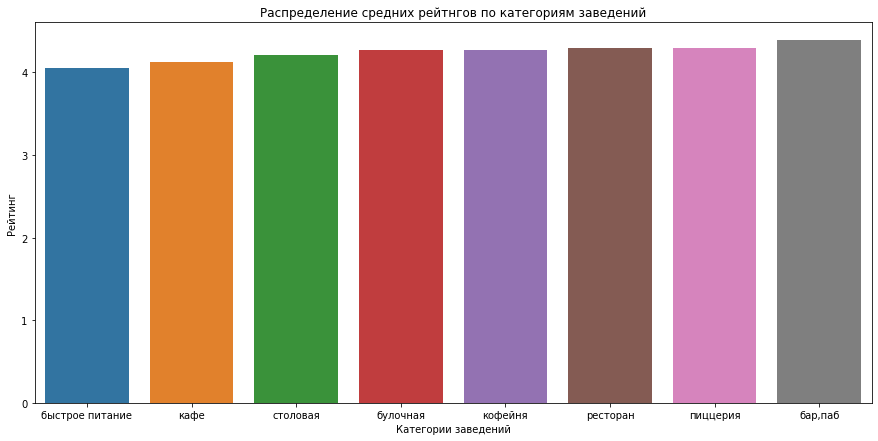

In [34]:
plt.figure(figsize = (15,7))
ax = sns.barplot(data = rating, x = 'category', y = 'rating')
ax.set_title('Распределение средних рейтнгов по категориям заведений')
ax.set_xlabel('Категории заведений')
ax.set_ylabel('Рейтинг');

In [35]:
fig = px.bar(rating, x = 'category', y = 'rating', color='category')
fig.update_layout(title = 'Распределение средних рейтнгов по категориям заведений',
                 xaxis_title='Категория заведения',
                 yaxis_title = 'Рейтинг')
fig.show()

***Вывод***

Усреднённые рейтинги почти не отличаются в разных категориях заведения.Все рейтинги выше 4.

Для лучшей наглядности вычтем из общий колонки рейтинга 4 (так как все выше 4), чтобы посмотреть более точно у кого рейтинг лучше, у кого хуже

In [36]:
rating['rating'] = rating['rating'] - 4
rating

,category,rating
2,быстрое питание,0.050249
3,кафе,0.123886
7,столовая,0.211429
1,булочная,0.268359
4,кофейня,0.277282
6,ресторан,0.290357
5,пиццерия,0.301264
0,"бар,паб",0.387712


In [37]:
fig = px.line(rating, x = 'category', y ='rating', markers = True)
fig.update_layout(title = 'Распределение средних рейтнгов (от 4) по категориям заведений',
                 xaxis_title='Категория заведения',
                 yaxis_title = 'Рейтинг')
fig.show()

***Вывод***

Самый низкий рейтинг у быстрого питания, чуть получше рейтинг  у кафе, потом у столовых, примерно на одном уровне булочные, кофейни, пиццерии и рестораны, выше всех рейтинг у баров и пабов.

### Фоновая картограмма


In [38]:
rating_df = data.groupby('district').agg({'rating':'median'}).reset_index()
rating_df

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [42]:
state_geo = 'admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start = 10)
Choropleth(
    geo_data=state_geo,
    data = rating_df,
    columns=['district', 'rating'],
    key_on = 'feature.name',
    fill_color='YlGn',
    fill_opacity = 0.8,
    legend_name = 'Медианный рейтинг заведений по районам'
).add_to(m)
m

***Вывод***

По хороплету видно, что в центральном районе лучше всех медианный рейтинг, в Северо-Восточном административном округе и Юго-Восточном административном округе самые маленькие рейтинги.

### Отображение всех заведений на карте

In [43]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup = f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)
m

***Вывод***

Выше представлена карта со всеми заведениями из датафрейма. Больше всего заведений в центральном районе Москвы. Много заведений на  МКАДе, это связано с тем, что МКАД имеет самую большую протяженность.

### Топ-15 улиц по количеству заведений 

In [44]:
streets = data.pivot_table(index='street',  values='name', aggfunc='count').reset_index().sort_values(by='name', ascending=False).head(15)
streets

,street,name
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


In [45]:
fig = px.bar(streets, x='street', y='name')
fig.update_layout(title = 'Количество заведений в топ-15 улицах Москвы',
                 xaxis_title='Улицы',
                 yaxis_title='Количество заведений')
fig.show()

In [46]:
streets_name = data.groupby('street').agg({'category':'unique', 
                            'name':'count'}).reset_index().sort_values(by='name', ascending=False).head(15)
pd.set_option("max_colwidth", 120)
streets_name

,street,category,name
1090,проспект Мира,"[ресторан, кафе, быстрое питание, пиццерия, булочная, кофейня, столовая, бар,паб]",184
773,Профсоюзная улица,"[бар,паб, ресторан, булочная, пиццерия, кофейня, столовая, кафе, быстрое питание]",122
1087,проспект Вернадского,"[пиццерия, бар,паб, столовая, быстрое питание, ресторан, кофейня, кафе, булочная]",108
525,Ленинский проспект,"[ресторан, столовая, кофейня, пиццерия, бар,паб, кафе, булочная, быстрое питание]",107
523,Ленинградский проспект,"[бар,паб, кафе, кофейня, ресторан, пиццерия, булочная, быстрое питание, столовая]",95
373,Дмитровское шоссе,"[ресторан, пиццерия, столовая, кафе, кофейня, быстрое питание, булочная, бар,паб]",88
455,Каширское шоссе,"[кофейня, ресторан, столовая, кафе, быстрое питание, пиццерия, бар,паб]",77
298,Варшавское шоссе,"[ресторан, быстрое питание, кофейня, кафе, столовая, пиццерия, бар,паб]",76
524,Ленинградское шоссе,"[ресторан, бар,паб, кафе, столовая, булочная, пиццерия, быстрое питание, кофейня]",70
550,МКАД,"[кафе, ресторан, бар,паб, быстрое питание, кофейня, столовая]",65


***Вывод***

По графику и датафрейму видно, что самая популярная улица это Проспект Мира, на ней расположены все категории общепита. Также все категории общепита расположены на улицах: Профсоюзная, Проспект Вернадского, Ленинский проспект, Ленинградский проспект, Дмитровское Шоссе, Ленинградском шоссе, Кутузовский проспект. На Каширском и Варшавском шоссе расположены все категории общепита, кроме булочных. На Пятницкой улице - все категории, кроме столовых. На улицах Вавилова и Миклухо-Маклая по 6 категорий заведения из 8 представленных (кафе, ресторан, бар, паб, быстрое питание, кофейня, пиццерия). 


### Улицы  с одним объектом общепита

In [48]:
streets_1 = data.pivot_table(
    index = 'street',columns = 'category', values='name', aggfunc='count'
).reset_index()
streets_1['бар,паб'] = streets_1['бар,паб'].fillna(0)
streets_1['булочная'] = streets_1['булочная'].fillna(0)
streets_1['быстрое питание'] = streets_1['быстрое питание'].fillna(0)
streets_1['кафе'] = streets_1['кафе'].fillna(0)
streets_1['кофейня'] = streets_1['кофейня'].fillna(0)
streets_1['пиццерия'] = streets_1['пиццерия'].fillna(0)
streets_1['ресторан'] = streets_1['ресторан'].fillna(0)
streets_1['столовая'] = streets_1['столовая'].fillna(0)

streets_1['result'] = (streets_1['бар,паб'] + streets_1['булочная'] + streets_1['быстрое питание'] +
                       streets_1['кафе'] + streets_1['кофейня'] + streets_1['пиццерия'] +
                       streets_1['ресторан'] + streets_1['столовая'])
streets_1 = streets_1[streets_1['result'] == 1]
streets_1['result'].count()

458

In [49]:
streets_1

category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,result
0,1-й Автозаводский проезд,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
1,1-й Балтийский переулок,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
2,1-й Варшавский проезд,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
3,1-й Вешняковский проезд,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
5,1-й Голутвинский переулок,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...
1436,улица Шкулёва,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
1437,улица Шкулёва 4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
1439,улица Шухова,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
1442,улица Юннатов,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0


Всего 458 улиц, где находится только один объект общепита

In [50]:
print(f"бар, паб - {streets_1[streets_1['бар,паб'] == 1]['бар,паб'].count()}")
print(f"булочная - {streets_1[streets_1['булочная'] == 1]['булочная'].count()}")
print(f"быстрое питание - {streets_1[streets_1['быстрое питание'] == 1]['быстрое питание'].count()}")
print(f"кафе - {streets_1[streets_1['кафе'] == 1]['кафе'].count()}")
print(f"кофейня - {streets_1[streets_1['кофейня'] == 1]['кофейня'].count()}")
print(f"пиццерия - {streets_1[streets_1['пиццерия'] == 1]['пиццерия'].count()}")
print(f"ресторан - {streets_1[streets_1['ресторан'] == 1]['ресторан'].count()}")
print(f"столовая - {streets_1[streets_1['столовая'] == 1]['столовая'].count()}")

бар, паб - 39
булочная - 8
быстрое питание - 23
кафе - 160
кофейня - 84
пиццерия - 15
ресторан - 93
столовая - 36


***Вывод***

Больше всего на таких улицах кафе, меньше всего булочных.

### Средние чеки заведений для каждого района

In [51]:
avg_bill = data.groupby('district').agg({'middle_avg_bill':'median'}).reset_index().sort_values(by='middle_avg_bill',
                                                                                               ascending=False)
avg_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [53]:
state_geo = 'admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start = 10)
Choropleth(
    geo_data=state_geo,
    data = avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on = 'feature.name',
    fill_color='YlGn',
    fill_opacity = 0.8,
    legend_name = 'Медианный средний чек заведений по районам'
).add_to(m)
m

***Вывод***

Самый большой средний чек в центральном и западном административном округе, самый маленький средний чек в Южном административном округе и в Юго-Восточном административном округе, также в Северо-Восточном административном округе.
Нет взаимосвязи между удаленностью и ценами в заведении, скорее всего это связано с населением в каждом административном округе.

### Другие взаимосвязи 

#### Взаимосвязь между кругслосуточными заведеними, их категориями и метосположением

In [54]:
hours = data.pivot_table(index = ['category', 'district'], 
                         values='is_24/7', aggfunc = 'sum').reset_index().sort_values(by = 'is_24/7',
                                                                                     ascending=False)
hours

,category,district,is_24/7
59,ресторан,Центральный административный округ,428
32,кафе,Центральный административный округ,275
33,кафе,Юго-Восточный административный округ,184
30,кафе,Северо-Восточный административный округ,170
27,кафе,Восточный административный округ,163
...,...,...,...
15,булочная,Юго-Восточный административный округ,9
69,столовая,Юго-Восточный административный округ,8
64,столовая,Западный административный округ,7
70,столовая,Юго-Западный административный округ,5


In [55]:
fig = px.bar(hours, x = 'district', y = 'is_24/7', color='category')
fig.update_layout(title = 'Количество круглосуточных заведений в Москве',
                 xaxis_title='Улицы',
                 yaxis_title='Количество заведений')
fig.show()

***Вывод***

Больше всего круглосуточных заведений в Центральном административном округе, меньше всего в Северо-Западном административном округе. В каждом округе из круглосуточных заведений больше всего ресторанов и кафе, меньше всего столовых и булочных.

### Общий вывод

Из анализа данных можно сделать следующие выводы:
- Больше всего по Москве: кафе, ресторанов и кофеен, меньше всего булочных
- Больше несетевых заведений, чем сетевых
- У кофеен больше сетевых заведений, чем несетевых. В остальных категориях общепита преобладают неетевые заведения
- Топ-5 самых популярных сетевых заведений в Москве: Шоколадница, Домино'с Пицца, Додо Пицца, One Price Coffee и Яндекс Лавка. Они относятся к категориям ресторанов, кофеен и пиццерий
- Самым большими сетями в каждой категории общепита из топ-15 самых популярных сетей в Москве являются:
    - Из категории кафе - Кафе
    - Из категории кафе - Кулинарная лавка братьев Караевых
    - Из категории кофейн - Шоколадница
    - Из категории пиццерий - Домино'с Пицца
    - Из категории реторанов - Яндекс Лавка
    - Из булочных - Буханка
- Больше всего заведений находится в центральном районе, меньше всего в северо-западном районе
- Большее количество заведений в Центральном районе Москвы приходится на рестораны, а меньше всего на булочные
- В Северно-Западном районе Москвы больше всего заведений приходится на кафе, а меньше всего на булочные
- В каждом административном округе больше всего ресторанов и кафе, меньше всего булочных и мест быстрого питания, также мало пабов и баров(кроме Центрального округа)
- Самый низкий рейтинг у мест быстрого питания
- Самый высокий рейтинг у баров и пабов
- В центральном районе Москвы самый высокий медианный рейтинг заведений
- В Северо-Восточном административном округе и Юго-Восточном административном округе самые низкие медианные рейтинги заведений
 - На 458 улицах Москвы расположен только один объект общепита. Чаще всего на таких улицах встречаются кафе и рестораны, меньше всего пиццерии и булочные
 - Самый большой средний чек в центральном и западном административном округе
 - Самый маленький средний чек в Южном административном округе и в Юго-Восточном административном округе, также в Северо-Восточном административном округе
 - Больше всего круглосуточных заведений в Центральном районе, меньше всего в Северо-Западном районе.
 - В каждом округе из круглосуточных заведений больше всего ресторанов и кафе, меньше всего столовых и булочных.

## Детализация исследования: открытие кофейни 

Основателям фонда «Shut Up and Take My Money» хотят открыть кофейню в Москве.

Цель:
- Проанализировать более детально кофейни в Москве

Задача:
- Определить, осуществима ли мечта клиентов.

### Количество кофейн. В каких районах их больше всего, особенности расположения

In [56]:
coffee = data[data['category'] == 'кофейня']
coffee['name'].count()

1413

Всего в Москве 1413 кофейн.

In [57]:
districts = coffee.groupby('district').agg({'name':'count'}).reset_index().sort_values(by = 'name', 
                                                                                       ascending=False)
districts.columns = ['district', 'count']
districts

,district,count
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [58]:
fig = px.bar(districts, x = 'district', y = 'count')
fig.update_layout(title = 'Количество кофейн в каждом районе Москвы',
                 xaxis_title='Районы',
                 yaxis_title='Количество кофейн')
fig.show()

***Вывод***

Больше всего кофеен расположено в Центральном районе Москвы, меньше всего в Северо-Западном районе Москвы.


In [60]:
data.apply(create_clusters, axis=1)
state_geo = 'admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start = 10)
Choropleth(
    geo_data=state_geo,
    data = districts,
    columns=['district', 'count'],
    key_on = 'feature.name',
    fill_color='YlGn',
    fill_opacity = 0.8,
    legend_name = 'Количество кофейн по районам'
).add_to(m)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup = f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

coffee.apply(create_clusters, axis=1)
m

***Вывод***

Большое количество кофеен в центре, меньше всего в Юго-Западном, Юго-Восточном и Северо-Западном районе Москвы
	

### Круглосуточные кофейни

In [61]:
hours = coffee[coffee['is_24/7'] == True]
hours['is_24/7'].sum()

628

Всего круглосуточных кофейн 628

In [62]:
hours_1 = hours.groupby('district').agg({'name':'count'}).reset_index().sort_values(by='name', ascending=False)
hours_1

,district,name
5,Центральный административный округ,152
2,Северный административный округ,89
1,Западный административный округ,80
3,Северо-Восточный административный округ,70
8,Южный административный округ,69
0,Восточный административный округ,50
7,Юго-Западный административный округ,48
6,Юго-Восточный административный округ,40
4,Северо-Западный административный округ,30


In [63]:
fig = px.bar(hours_1, x = 'district', y ='name', color = 'district')
fig.update_layout(title = 'Количество круглосуточных кофейн в каждом районе Москвы',
                 xaxis_title='Районы',
                 yaxis_title='Количество кофейн')
fig.show()

***Вывод***

Больше всего круглосуточных кафе в центре, меньше всего в Северо-Западном округе.

In [64]:
part = {'time':['is_24/7', 'not_24/7'],
       'count':[coffee[coffee['is_24/7'] == True]['is_24/7'].count(),
               coffee[coffee['is_24/7'] == False]['is_24/7'].count()]}

### Рейтинги кофейн

In [66]:
ratings = coffee.groupby('district').agg({'rating':'median'}).reset_index()
state_geo = 'admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start = 10)
Choropleth(
    geo_data=state_geo,
    data = ratings,
    columns=['district', 'rating'],
    key_on = 'feature.name',
    fill_color='YlGn',
    fill_opacity = 0.8,
    legend_name = 'Медианный рейтинг кофейн по районам'
).add_to(m)
m

***Вывод***

В Западном районе самые низкие рейтинги по кофейням. В остальных районах практически одинаковые рейтинги.

### Средняя стоимость чашки капучино

In [67]:
print(coffee['middle_coffee_cup'].median())
print(round(coffee['middle_coffee_cup'].mean()))

170.0
175


Средняя стоимость чашки капучино по всем кофейням от 170 до 175 рублей.

Надо посмотреть по отдельным районам

In [68]:
coffee['price_cup'] = coffee['middle_coffee_cup']
price = coffee.groupby('district').agg({'middle_coffee_cup':'median',
                                       'price_cup':'mean'}).reset_index().sort_values(by=['middle_coffee_cup',
                                                                                         'price_cup'])
price

,district,middle_coffee_cup,price_cup
0,Восточный административный округ,135.0,174.023810
6,Юго-Восточный административный округ,147.5,151.088235
8,Южный административный округ,150.0,158.488372
2,Северный административный округ,159.0,165.789474
3,Северо-Восточный административный округ,162.5,165.333333
4,Северо-Западный административный округ,165.0,165.523810
1,Западный административный округ,189.0,189.938776
5,Центральный административный округ,190.0,187.518519
7,Юго-Западный административный округ,198.0,184.176471


In [69]:
fig1 = px.bar(price, x = 'district', y = 'middle_coffee_cup')
fig2 = px.bar(price, x = 'district', y = 'price_cup')
fig = go.Figure(data = fig1.data+fig2.data)
fig.update_layout(title = 'Cредняя стоимость чашки капучино в Москве по раойнам',
                 xaxis_title='Районы',
                 yaxis_title='Стоимость')
fig.show()

***Вывод***

Стоимость на чашку капучино в кадом административно округе Москвы:
- Восточный административный округ  - стоимость от 135 до 174 рублей
- Западный административный округ - стоимость от 189 до 190 рублей
- Северный административный округ - стоимость от 159 до 166 рублей
- Северо-Восточный административный округ - стоимость от 159 до 166 рублей
- Северо-Западный административный округ - стоимость от 165 до 166 рублей
- Центральный административный округ - стоимость от 188 до 190 рублей
- Юго-Восточный административный округ - стоимость от 148 до 151 рублей
- Юго-Западный административный округ - стоимость от 184 до 198 рублей
- Южный административный округ - стоимость от 150 до 158 рублей

При открытии стоит ориентироваться на 170 - 175 рублей за чашку капучино, так как это не слишком низкая, так и не слишком высокая цена.

### Сетевые кофейни

In [70]:
print(f"Количество сетевых кофейн - {coffee[coffee['chain'] == 1]['chain'].count()}")
print(f"Количество несетевых кофейн - {coffee[coffee['chain'] == 0]['chain'].count()}")

Количество сетевых кофейн - 720
Количество несетевых кофейн - 693


In [71]:
choice = {'chain':['chain', 'not_chain'],
         'count' : [coffee[coffee['chain'] == 1]['chain'].count(),
                   coffee[coffee['chain'] == 0]['chain'].count()]}
fig = go.Figure(data = [go.Pie(labels = choice['chain'], values = choice['count'])])
fig.update_layout(title = 'Соотношение сетевых кофейн к несетевым')
fig.show()

***Вывод***

Больше сетевых кофеен, чем несетевых

### Количество посадочных мест

In [72]:
coffee['seats'].median()

80.0

In [73]:
seats = coffee.groupby('district').agg({'seats':'median'}).reset_index().sort_values(by='seats', 
                                                                                     ascending=False)
seats

,district,seats
1,Западный административный округ,96.0
4,Северо-Западный административный округ,87.5
5,Центральный административный округ,86.0
8,Южный административный округ,80.0
3,Северо-Восточный административный округ,75.0
2,Северный административный округ,66.0
7,Юго-Западный административный округ,64.5
0,Восточный административный округ,55.0
6,Юго-Восточный административный округ,50.0


In [74]:
fig = px.bar(seats, x = 'district', y = 'seats')
fig.update_layout(title = 'Количество посадочных меств в кофейнях в каждом районе Москвы',
                 xaxis_title='Районы',
                 yaxis_title='Количество посадочных мест ')
fig.show()

***Вывод***

Больше всего мест в Западном районе (около 96), а меньше всего Юго-Восточном округе (около 50). При открытии кофейни стоит ориентировать на количестве посадочных мест от 80, для того чтобы оправдать спрос клиентов и не было недовольных отзывов о нехватке мест. Лучше не открывать в Западном районе, так как нужно делать от 100 посадочных мест (это очень большая кофейня)

### Общий вывод

***Рекомендации:***
- Больше всего кофеен расположено в Центральном районе Москвы, меньше всего в Северо-Западном районе Москвы. Скорее всего лучше расположить кофейню в центральном районе, чтобы был больше спрос и больше клиентов
- Большое количество круглосуточных кофеен в центре, меньше всего в Северо-Западном районе Москвы. Скорее всего не стоит делать круглосуточную кофейню, так как на это нужно много ресурсов.
- Самые низкие рейтинги находятся в Юго-Западном районе. Лушче не стоит размещать так кафе, так как там очень придирчивые клиенты, которые смогут поставить низкие рейтинги сразу же, что приведет к потере потенциальных покупателей и тем амым к разорению.
- При открытии стоит ориентироваться на 170 - 175 рублей за чашку капучино, так как это не слишком низкая, так и не слишком высокая цена. И она не вызовет у покупателей никакого удивления.
- Стоит ориентироваться на количество посадочных мест от 80
- Лучше не открывать в Западном районе, так как нужно делать от 100 посадочных мест (это очень большая кофейня)

## Презентация

Презентация: <https://drive.google.com/file/d/18I098girFEVYgu2EZDK326DfEaOsRS0B/view?usp=share_link> 

## Выводы

За проект было сделано несколько этапов:
- 1) Изучение общей информации. Ознакомление с данными
- 2) Предработка данных.
     - Не было выявлено явных и неявных дубликатов (повторяющихся строчек).
     - Были пропуски в данных, но во избежание искажения результатов исследования они не были заполнены.
     - Было создано два столбца: 
         - "street" - с названием улицы заведения
         - "is_24/7" - с обозначением, что заведение работает круглосуточно и  ежедневно
- 3) Анализ данных и выявление закономерностей
    - Всего 8 различных категорий мест общественного питания. Больше всего кафе, ресторанов и кофеин. Меньше всего булочных и столовых.
    - Больше всего посадочных мест в ресторанов, кафе и кофейнях. Меньше всего в булочных и столовых.
    - Сетевых заведений всего 38.1%, а несетевых - 61.9%. 
    - У кофеен больше всего сетевых заведений, чем несетевых. Во всех остальных категориях преобладают несетевые заведения, над сетевыми.
    - Самыми популярными сетями являются: 
        - 1) Шоколадница относится к категории кофейни.
        - 2) Домино'с Пиццы относится к категории пиццерии.
        - 3) Додо Пиццы относится к категории пиццерии.
        - 4) One Price Coffee относится к категории кофейни.
        - 5) Яндекс Лавка относится к категории ресторанов.
    - Самыми большими в каждой категории общепита являются заведения:
        - Из категории кафе - Кулинарная лавка братьев Караевых
        - Из категории кофейн - Шоколадница
        - Из категории пиццерий - Домино'с Пицца
        - Из категории реторанов - Яндекс Лавка
        - Из булочных - Буханка
    - Центральный административный округ самый популярный среди местоположению заведений, меньше всего заведений в Северо - Западном районе Москвы. В каждом районе больше всего ресторанов и кафе, меньше всего булочных и заведений быстрого питания.
    - В Центральном районе самый лучший рейтинг всех заведений, в Северо-Восточном и Юго-Восточном районах самые низкие рейтинги
    - Самая популярная улица это Проспект МИра. На этой улице находятся и кафе, и рестораны, и кофейни.
    - Всего 458 улиц с одним объектом общепита. На таких улицах больше всего кафе, и меньше всего булочных.
    - Самый большой средний чек в Центральном районе, а самый маленький в Южном, Южно-Восточном  и Северо-Восточном районах Москвы.
    - Больше всего круглосуточных заведений в Центральном районе. Из них большую часть занимают рестораны и кафе.
- 4) Открытие кофейни. Основные рекомендации:
    - Лучший район для расположения кофейни - Центральный. Так как он популярный из-за этого там больше клиентов.
    - Не стоит открывать круглосуточные кафе, так как это требует больше ресурсов, чем открытие простого кафе.
    - Самый низкий рейтинг в Западном районе. Поэтому там не  стоит открывать кофейню во избежание негативных отзывов от придирчивых клиентов.
    - Стоит ориентироваться на 170-175 рублей на чашку капучино, чтобы не вызывать вопросы у покупателей
    - Количество посадочных мест должно быть от 80
